<a href="https://colab.research.google.com/github/EmilDragola/4KyrsNeiroseti/blob/master/NeirosetiPrakticheskaya7.2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Практическая работа №7. Использование автоэнкодера для решения задач семантической сегментации. Часть 2

[**Ссылка на код с пары**](https://colab.research.google.com/drive/1kcXnm6ZNrjkjUHlkgAIFBmxDd_6lNIHd?usp=sharing)

## Пример создания модели с Unet-подобной архитектурой

In [ ]:
from tensorflow.keras import Model, Input
from keras.layers import Conv2D, MaxPooling2D, concatenate, UpSampling2D, Dropout, Cropping2D, Softmax, Conv2DTranspose
from keras.preprocessing import image
from keras.utils.vis_utils import plot_model

In [ ]:
def mini_u_net(image_shape, num_of_classes):
  
  input_image = Input(image_shape)

  # Encoder
  
  conv1_1 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv1_1')(input_image)
  conv1_2 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv1_2')(conv1_1)
  
  pool_1 = MaxPooling2D(name = 'pool_1')(conv1_2)
  
  conv2_1 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2_1')(pool_1)
  conv2_2 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2_2')(conv2_1)
  
  pool_2 = MaxPooling2D(name = 'pool_2')(conv2_2)
  
  conv3_1 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv3_1')(pool_2)
  conv3_2 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv3_2')(conv3_1)
  
  pool_3 = MaxPooling2D(name = 'pool_3')(conv3_2)
  
  conv4_1 = Conv2D(filters = 256, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv4_1')(pool_3)
  conv4_2 = Conv2D(filters = 256, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv4_2')(conv4_1)
  
  
  
  # Decoder
  
  upconv5_1 = UpSampling2D(name = 'upconv5_1')(conv4_2)
  upconv5_2 = Conv2D(filters = 128, kernel_size = (2, 2), activation = 'relu', padding = 'same', name = 'upconv5_2')(upconv5_1)
  concat_5 = concatenate([upconv5_2, conv3_2], axis = 3, name = 'concat_5') # Split Connections
  
  conv5_1 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv5_1')(concat_5)
  conv5_2 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv5_2')(conv5_1)
  
  
  upconv6_1 = UpSampling2D(name = 'upconv6_1')(conv5_2)
  upconv6_2 = Conv2D(filters = 64, kernel_size = (2, 2), activation = 'relu', padding = 'same', name = 'upconv6_2')(upconv6_1)
  concat_6 = concatenate([upconv6_2, conv2_2], axis = 3, name = 'concat_6') # Split Connections
  
  conv6_1 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv6_1')(concat_6)
  conv6_2 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv6_2')(conv6_1)
  
  upconv7_1 = UpSampling2D(name = 'upconv7_1')(conv6_2)
  upconv7_2 = Conv2D(filters = 32, kernel_size = (2, 2), activation = 'relu', padding = 'same', name = 'upconv7_2')(upconv7_1)
  concat_7 = concatenate([upconv7_2, conv1_2], axis = 3, name = 'concat_7') # Split Connections
  
  conv7_1 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv7_1')(concat_7)
  conv7_2 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv7_2')(conv7_1)
  
  conv8 = Conv2D(filters = num_of_classes, kernel_size = (1, 1), activation = 'softmax', name = 'conv8')(conv7_2)
  
  model = Model(inputs = input_image, outputs = conv8, name = 'model')
  
  return model

In [ ]:
unet_model = mini_u_net(image_shape = [256, 256, 3], num_of_classes = 6)

### Описание и визуализация архитектуры созданной модели

In [ ]:
unet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_1 (Conv2D)               (None, 256, 256, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv1_2 (Conv2D)               (None, 256, 256, 32  9248        ['conv1_1[0][0]']                
                                )                                                             

In [ ]:
unet_model.get_config()

{'name': 'model',
 'trainable': True,
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 256, 256, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'input_1'},
   'name': 'input_1',
   'inbound_nodes': []},
  {'class_name': 'Conv2D',
   'config': {'name': 'conv1_1',
    'trainable': True,
    'dtype': 'float32',
    'filters': 32,
    'kernel_size': (3, 3),
    'strides': (1, 1),
    'padding': 'same',
    'data_format': 'channels_last',
    'dilation_rate': (1, 1),
    'groups': 1,
    'activation': 'relu',
    'use_bias': True,
    'kernel_initializer': {'class_name': 'GlorotUniform',
     'config': {'seed': None}},
    'bias_initializer': {'class_name': 'Zeros', 'config': {}},
    'kernel_regularizer': None,
    'bias_regularizer': None,
    'activity_regularizer': None,
    'kernel_constraint': None,
    'bias_constraint': None},
   'name': 'conv1_1',
   'inbound_nodes': [[['input_1', 0, 0, {}]]]},
  {'class_name': 'C

Для визуализации архитектуры модели используется следующий код:

```
plot_model(
unet_model, to_file='model.png', show_shapes=False, show_dtype=False,
show_layer_names=True, rankdir='TB', expand_nested=False, dpi=96
)
```



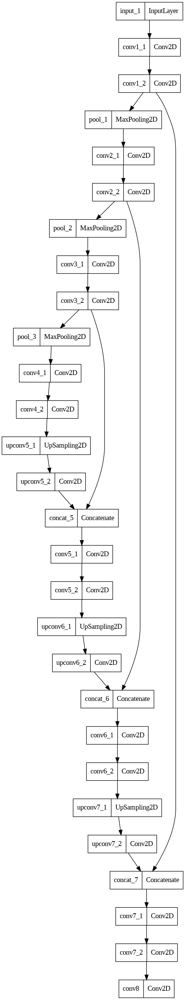

## Задание №1. Создайте модель со следующей архитектурой:

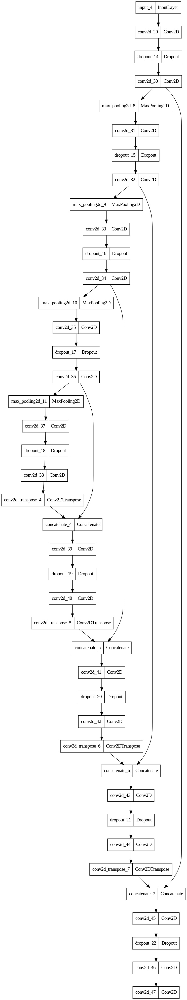

In [ ]:
!pip install patchify
!pip install tensorflow==2.9.0
!pip install -U -q segmentation-models

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.7/511.7 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 48.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 18.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.7/438.7 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 56.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 75.4 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.12.0
    Uninstalling keras-2.12.0:
      Successfully uninstalled keras-2.12.0
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 23.3.3
    U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 6.9 MB/s eta 0:00:00


In [ ]:
from tensorflow.keras import Model, Input
from keras.layers import Conv2D, MaxPooling2D, concatenate, UpSampling2D, Dropout, Cropping2D, Softmax, Conv2DTranspose
from keras.preprocessing import image
from keras.utils.vis_utils import plot_model
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from keras.backend import conv2d_transpose
def mini_u_net(image_shape, num_of_classes):
  
  input4_image = Input(image_shape)

  # Encoder
  
  conv2d_29 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_29')(input4_image)
  dropout_14 = Dropout(rate=0.5, name='dropout_14')(conv2d_29)
  conv2d_30 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_30')(dropout_14)

  max_pooling2d_8 = MaxPooling2D(name = 'pool_1')(conv2d_30)
  
  conv2d_31 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_31')(max_pooling2d_8)
  dropout_15 = Dropout(rate=0.5, name='dropout_15')(conv2d_31)
  conv2d_32 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_32')(dropout_15)

  max_pooling2d_9 = MaxPooling2D(name = 'pool_2')(conv2d_32)
  
  conv2d_33 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_33')(max_pooling2d_9)
  dropout_16 = Dropout(rate=0.5, name='dropout_16')(conv2d_33)
  conv2d_34 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_34')(dropout_16)

  max_pooling2d_10 = MaxPooling2D(name = 'pool_3')(conv2d_34)
  
  conv2d_35 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_35')(max_pooling2d_10)
  dropout_17 = Dropout(rate=0.5, name='dropout_17')(conv2d_35)
  conv2d_36 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_36')(dropout_17) 
  
  max_pooling2d_11 = MaxPooling2D(name = 'pool_4')(conv2d_36)

  conv2d_37 = Conv2D(filters = 256, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_37')(max_pooling2d_11)
  dropout_18 = Dropout(rate=0.5, name='dropout_18')(conv2d_37)
  conv2d_38 = Conv2D(filters = 256, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_38')(dropout_18) 
  
  conv2d_transponse_4 = Conv2DTranspose(16, (3, 3), strides=2, activation="relu", padding="same", name = 'conv2d_transponse_4')(conv2d_38)
  concatenate_4 = concatenate([conv2d_transponse_4, conv2d_36], axis=3, name = 'concatenate_4')


  conv2d_39 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_39')(concatenate_4)
  dropout_19 = Dropout(rate=0.5, name='dropout_19')(conv2d_39)
  conv2d_40 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_40')(dropout_19) 

  conv2d_transponse_5 = Conv2DTranspose(16, (3, 3), strides=2, activation="relu", padding="same", name = 'conv2d_transponse_5')(conv2d_40)
  concatenate_5 = concatenate([conv2d_transponse_5, conv2d_34], axis = 3, name = 'concatenate_5')

  conv2d_41 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_41')(concatenate_5)
  dropout_20 = Dropout(rate=0.5, name='dropout_20')(conv2d_41)
  conv2d_42 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_42')(dropout_20) 

  conv2d_transponse_6 = Conv2DTranspose(16, (3, 3), strides=2, activation="relu", padding="same", name = 'conv2d_transponse_6')(conv2d_42)
  concatenate_6 = concatenate([conv2d_transponse_6, conv2d_32], axis = 3, name = 'concatenate_6')

  conv2d_43 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_43')(concatenate_6)
  dropout_21 = Dropout(rate=0.5, name='dropout_21')(conv2d_43)
  conv2d_44 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_44')(dropout_21) 

  conv2d_transponse_7 = Conv2DTranspose(16, (3, 3), strides=2, activation="relu", padding="same", name = 'conv2d_transponse_7')(conv2d_44)
  concatenate_7 = concatenate([conv2d_transponse_7, conv2d_30], axis = 3, name = 'concatenate_7') 

  conv2d_45 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_45')(concatenate_7)
  dropout_22 = Dropout(rate=0.5, name='dropout_22')(conv2d_45)
  conv2d_46 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2d_46')(dropout_22) 
  conv2d_47 = Conv2D(filters = num_of_classes, kernel_size = (1, 1), activation = 'softmax', name = 'conv2d_47')(conv2d_46)

  model_2 = Model(inputs = input4_image, outputs = conv2d_47, name = 'model_2')
  
  return model_2


In [ ]:
model_2 = mini_u_net(image_shape = [256, 256, 3], num_of_classes = 6)
model_2.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_29 (Conv2D)             (None, 256, 256, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_14 (Dropout)           (None, 256, 256, 32  0           ['conv2d_29[0][0]']              
                                )                                                           

In [ ]:
model_2.get_config()

{'name': 'model_2',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 256, 256, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'input_1'},
   'name': 'input_1',
   'inbound_nodes': []},
  {'class_name': 'Conv2D',
   'config': {'name': 'conv2d_29',
    'trainable': True,
    'dtype': 'float32',
    'filters': 32,
    'kernel_size': (3, 3),
    'strides': (1, 1),
    'padding': 'same',
    'data_format': 'channels_last',
    'dilation_rate': (1, 1),
    'groups': 1,
    'activation': 'relu',
    'use_bias': True,
    'kernel_initializer': {'class_name': 'GlorotUniform',
     'config': {'seed': None}},
    'bias_initializer': {'class_name': 'Zeros', 'config': {}},
    'kernel_regularizer': None,
    'bias_regularizer': None,
    'activity_regularizer': None,
    'kernel_constraint': None,
    'bias_constraint': None},
   'name': 'conv2d_29',
   'inbound_nodes': [[['input_1', 0, 0, {}]]]},
  {'class_name': 'Dropout',
   'c

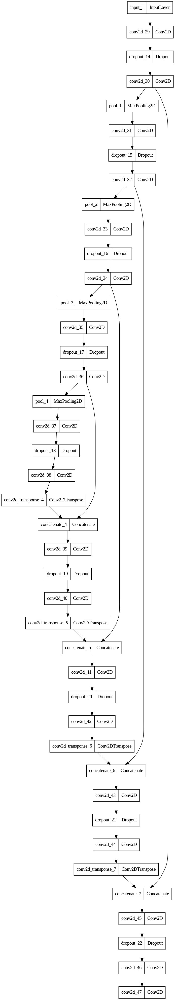

In [ ]:
plot_model(
model_2, to_file='model.png', show_shapes=False, show_dtype=False,
show_layer_names=True, rankdir='TB', expand_nested=False, dpi=96
)

## Задание №2. Обучите созданную модель для решения задачи семантической сегментации. В качестве функции потерь используйте ту, которая лучше всего показала себя в первой части работы

### 2.1. Загрузите три снимка, а также маски, соответствующие этим снимкам, из папки Tiles 8

In [ ]:
img = cv2.imread("/content/drive/MyDrive/Semantic segmentation dataset/Tile 8/images/image_part_004.jpg", 1)
original_mask = cv2.imread("/content/drive/MyDrive/Semantic segmentation dataset/Tile 8/masks/image_part_004.png", 1)
original_mask = cv2.cvtColor(original_mask,cv2.COLOR_BGR2RGB)

img2 = cv2.imread("/content/drive/MyDrive/Semantic segmentation dataset/Tile 7/images/image_part_005.jpg", 1)
original_mask2 = cv2.imread("/content/drive/MyDrive/Semantic segmentation dataset/Tile 7/masks/image_part_005.png", 1)
original_mask2 = cv2.cvtColor(original_mask2,cv2.COLOR_BGR2RGB)

img3 = cv2.imread("/content/drive/MyDrive/Semantic segmentation dataset/Tile 8/images/image_part_007.jpg", 1)
original_mask3 = cv2.imread("/content/drive/MyDrive/Semantic segmentation dataset/Tile 8/masks/image_part_007.png", 1)
original_mask3 = cv2.cvtColor(original_mask3,cv2.COLOR_BGR2RGB)

### 2.2. Используя обученную модель, обработайте снимки по технологии, рассмотренной на практическом занятии (делим снимок на части, затем каждую часть обрабатываем нейросетью, а после соединяем все части для получения полноразмерной маски исходного снимка)

In [ ]:
from keras.models import load_model
from PIL import Image
                  
patch_size = 256

n_classes = 6

In [ ]:
from patchify import patchify
from patchify import unpatchify

In [ ]:
SIZE_X = (img.shape[1]//patch_size)*patch_size
SIZE_Y = (img.shape[0]//patch_size)*patch_size
large_img = Image.fromarray(img)
large_img = large_img.crop((0 ,0, SIZE_X, SIZE_Y))
large_img = np.array(large_img)     


patches_img = patchify(large_img, (patch_size, patch_size, 3), step=patch_size)
patches_img = patches_img[:,:,0,:,:,:]

In [ ]:
model2 = load_model("/content/drive/MyDrive/ModelZad7(2).h5", compile=False)

1/1 [==============================] - 0s 35ms/step


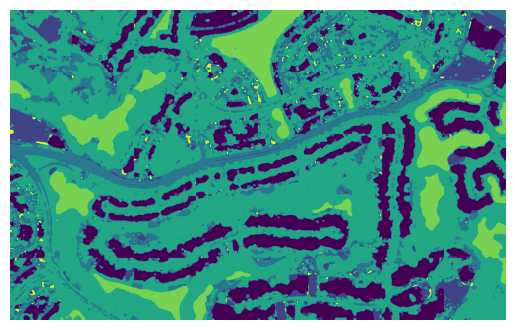

In [ ]:

patched_prediction = []

for i in range(patches_img.shape[0]):
    for j in range(patches_img.shape[1]):
        single_patch_img = patches_img[i,j,:,:,:]
        single_patch_img = scaler.fit_transform(single_patch_img.reshape(-1, single_patch_img.shape[-1])).reshape(single_patch_img.shape)
        single_patch_img = np.expand_dims(single_patch_img, axis=0)
        pred = model2.predict(single_patch_img)
        pred = np.argmax(pred, axis=3)
        pred = pred[0, :,:]
        patched_prediction.append(pred)

patched_prediction = np.array(patched_prediction)
patched_prediction = np.reshape(patched_prediction, [patches_img.shape[0], patches_img.shape[1], 
                                            patches_img.shape[2], patches_img.shape[3]])

unpatched_prediction = unpatchify(patched_prediction, (large_img.shape[0], large_img.shape[1]))

plt.axis('off')
plt.imshow(unpatched_prediction)

In [ ]:
"""

Original code is from the following source. It comes with MIT License so please mention
the original reference when sharing.

The original code has been modified to fix a couple of bugs and chunks of code
unnecessary for smooth tiling are removed. 

# MIT License
# Copyright (c) 2017 Vooban Inc.
# Coded by: Guillaume Chevalier
# Source to original code and license:
#     https://github.com/Vooban/Smoothly-Blend-Image-Patches
#     https://github.com/Vooban/Smoothly-Blend-Image-Patches/blob/master/LICENSE

"""
"""Perform smooth predictions on an image from tiled prediction patches."""


import numpy as np
import scipy.signal
from tqdm import tqdm

import gc


if __name__ == '__main__':
    import matplotlib.pyplot as plt
    PLOT_PROGRESS = False
    # See end of file for the rest of the __main__.
else:
    PLOT_PROGRESS = False


def _spline_window(window_size, power=2):
    """
    Squared spline (power=2) window function:
    https://www.wolframalpha.com/input/?i=y%3Dx**2,+y%3D-(x-2)**2+%2B2,+y%3D(x-4)**2,+from+y+%3D+0+to+2
    """
    intersection = int(window_size/4)
    wind_outer = (abs(2*(scipy.signal.triang(window_size))) ** power)/2
    wind_outer[intersection:-intersection] = 0

    wind_inner = 1 - (abs(2*(scipy.signal.triang(window_size) - 1)) ** power)/2
    wind_inner[:intersection] = 0
    wind_inner[-intersection:] = 0

    wind = wind_inner + wind_outer
    wind = wind / np.average(wind)
    return wind


cached_2d_windows = dict()
def _window_2D(window_size, power=2):
    """
    Make a 1D window function, then infer and return a 2D window function.
    Done with an augmentation, and self multiplication with its transpose.
    Could be generalized to more dimensions.
    """
    # Memoization
    global cached_2d_windows
    key = "{}_{}".format(window_size, power)
    if key in cached_2d_windows:
        wind = cached_2d_windows[key]
    else:
        wind = _spline_window(window_size, power)
        wind = np.expand_dims(np.expand_dims(wind, 1), 1)      #SREENI: Changed from 3, 3, to 1, 1 
        wind = wind * wind.transpose(1, 0, 2)
        if PLOT_PROGRESS:
            # For demo purpose, let's look once at the window:
            plt.imshow(wind[:, :, 0], cmap="viridis")
            plt.title("2D Windowing Function for a Smooth Blending of "
                      "Overlapping Patches")
            plt.show()
        cached_2d_windows[key] = wind
    return wind


def _pad_img(img, window_size, subdivisions):
    """
    Add borders to img for a "valid" border pattern according to "window_size" and
    "subdivisions".
    Image is an np array of shape (x, y, nb_channels).
    """
    aug = int(round(window_size * (1 - 1.0/subdivisions)))
    more_borders = ((aug, aug), (aug, aug), (0, 0))
    ret = np.pad(img, pad_width=more_borders, mode='reflect')
    # gc.collect()

    if PLOT_PROGRESS:
        # For demo purpose, let's look once at the window:
        plt.imshow(ret)
        plt.title("Padded Image for Using Tiled Prediction Patches\n"
                  "(notice the reflection effect on the padded borders)")
        plt.show()
    return ret


def _unpad_img(padded_img, window_size, subdivisions):
    """
    Undo what's done in the `_pad_img` function.
    Image is an np array of shape (x, y, nb_channels).
    """
    aug = int(round(window_size * (1 - 1.0/subdivisions)))
    ret = padded_img[
        aug:-aug,
        aug:-aug,
        :
    ]
    # gc.collect()
    return ret


def _rotate_mirror_do(im):
    """
    Duplicate an np array (image) of shape (x, y, nb_channels) 8 times, in order
    to have all the possible rotations and mirrors of that image that fits the
    possible 90 degrees rotations.
    It is the D_4 (D4) Dihedral group:
    https://en.wikipedia.org/wiki/Dihedral_group
    """
    mirrs = []
    mirrs.append(np.array(im))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=1))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=2))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=3))
    im = np.array(im)[:, ::-1]
    mirrs.append(np.array(im))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=1))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=2))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=3))
    return mirrs


def _rotate_mirror_undo(im_mirrs):
    """
    merges a list of 8 np arrays (images) of shape (x, y, nb_channels) generated
    from the `_rotate_mirror_do` function. Each images might have changed and
    merging them implies to rotated them back in order and average things out.
    It is the D_4 (D4) Dihedral group:
    https://en.wikipedia.org/wiki/Dihedral_group
    """
    origs = []
    origs.append(np.array(im_mirrs[0]))
    origs.append(np.rot90(np.array(im_mirrs[1]), axes=(0, 1), k=3))
    origs.append(np.rot90(np.array(im_mirrs[2]), axes=(0, 1), k=2))
    origs.append(np.rot90(np.array(im_mirrs[3]), axes=(0, 1), k=1))
    origs.append(np.array(im_mirrs[4])[:, ::-1])
    origs.append(np.rot90(np.array(im_mirrs[5]), axes=(0, 1), k=3)[:, ::-1])
    origs.append(np.rot90(np.array(im_mirrs[6]), axes=(0, 1), k=2)[:, ::-1])
    origs.append(np.rot90(np.array(im_mirrs[7]), axes=(0, 1), k=1)[:, ::-1])
    return np.mean(origs, axis=0)


def _windowed_subdivs(padded_img, window_size, subdivisions, nb_classes, pred_func):
    """
    Create tiled overlapping patches.
    Returns:
        5D numpy array of shape = (
            nb_patches_along_X,
            nb_patches_along_Y,
            patches_resolution_along_X,
            patches_resolution_along_Y,
            nb_output_channels
        )
    Note:
        patches_resolution_along_X == patches_resolution_along_Y == window_size
    """
    WINDOW_SPLINE_2D = _window_2D(window_size=window_size, power=2)

    step = int(window_size/subdivisions)
    padx_len = padded_img.shape[0]
    pady_len = padded_img.shape[1]
    subdivs = []

    for i in range(0, padx_len-window_size+1, step):
        subdivs.append([])
        for j in range(0, pady_len-window_size+1, step):            #SREENI: Changed padx to pady (Bug in original code)
            patch = padded_img[i:i+window_size, j:j+window_size, :]
            subdivs[-1].append(patch)

    # Here, `gc.collect()` clears RAM between operations.
    # It should run faster if they are removed, if enough memory is available.
    gc.collect()
    subdivs = np.array(subdivs)
    gc.collect()
    a, b, c, d, e = subdivs.shape
    subdivs = subdivs.reshape(a * b, c, d, e)
    gc.collect()

    subdivs = pred_func(subdivs)
    gc.collect()
    subdivs = np.array([patch * WINDOW_SPLINE_2D for patch in subdivs])
    gc.collect()

    # Such 5D array:
    subdivs = subdivs.reshape(a, b, c, d, nb_classes)
    gc.collect()

    return subdivs


def _recreate_from_subdivs(subdivs, window_size, subdivisions, padded_out_shape):
    """
    Merge tiled overlapping patches smoothly.
    """
    step = int(window_size/subdivisions)
    padx_len = padded_out_shape[0]
    pady_len = padded_out_shape[1]

    y = np.zeros(padded_out_shape)

    a = 0
    for i in range(0, padx_len-window_size+1, step):
        b = 0
        for j in range(0, pady_len-window_size+1, step):                #SREENI: Changed padx to pady (Bug in original code)
            windowed_patch = subdivs[a, b]
            y[i:i+window_size, j:j+window_size] = y[i:i+window_size, j:j+window_size] + windowed_patch
            b += 1
        a += 1
    return y / (subdivisions ** 2)


def predict_img_with_smooth_windowing(input_img, window_size, subdivisions, nb_classes, pred_func):
    """
    Apply the `pred_func` function to square patches of the image, and overlap
    the predictions to merge them smoothly.
    See 6th, 7th and 8th idea here:
    http://blog.kaggle.com/2017/05/09/dstl-satellite-imagery-competition-3rd-place-winners-interview-vladimir-sergey/
    """
    pad = _pad_img(input_img, window_size, subdivisions)
    pads = _rotate_mirror_do(pad)

    # Note that the implementation could be more memory-efficient by merging
    # the behavior of `_windowed_subdivs` and `_recreate_from_subdivs` into
    # one loop doing in-place assignments to the new image matrix, rather than
    # using a temporary 5D array.

    # It would also be possible to allow different (and impure) window functions
    # that might not tile well. Adding their weighting to another matrix could
    # be done to later normalize the predictions correctly by dividing the whole
    # reconstructed thing by this matrix of weightings - to normalize things
    # back from an impure windowing function that would have badly weighted
    # windows.

    # For example, since the U-net of Kaggle's DSTL satellite imagery feature
    # prediction challenge's 3rd place winners use a different window size for
    # the input and output of the neural net's patches predictions, it would be
    # possible to fake a full-size window which would in fact just have a narrow
    # non-zero dommain. This may require to augment the `subdivisions` argument
    # to 4 rather than 2.

    res = []
    for pad in tqdm(pads):
        # For every rotation:
        sd = _windowed_subdivs(pad, window_size, subdivisions, nb_classes, pred_func)
        one_padded_result = _recreate_from_subdivs(
            sd, window_size, subdivisions,
            padded_out_shape=list(pad.shape[:-1])+[nb_classes])

        res.append(one_padded_result)

    # Merge after rotations:
    padded_results = _rotate_mirror_undo(res)

    prd = _unpad_img(padded_results, window_size, subdivisions)

    prd = prd[:input_img.shape[0], :input_img.shape[1], :]

    if PLOT_PROGRESS:
        plt.imshow(prd)
        plt.title("Smoothly Merged Patches that were Tiled Tighter")
        plt.show()
    return prd

In [ ]:
input_img = scaler.fit_transform(img.reshape(-1, img.shape[-1])).reshape(img.shape)
# При использовании алгоритма Вы передаёте Вашу `pred_func` (model.predict(...)), которая будет обрабатывать все изображения 8 раз, накладывая небольшие участки с перекрытием, 
# Обратите внимание, что model.predict(...) принимает 4D тензор формы (batch, x, y, nb_channels).
predictions_smooth = predict_img_with_smooth_windowing(
    input_img,
    window_size=patch_size,
    subdivisions=2,  # Минимальное количество перекрытий для окон. Должно быть четным числом.
    nb_classes=n_classes,
    pred_func=(
        lambda img_batch_subdiv: model2.predict((img_batch_subdiv))
    )
)

final_prediction = np.argmax(predictions_smooth, axis=2)

  0%|          | 0/8 [00:00<?, ?it/s]

7/7 [==============================] - 1s 140ms/step


 12%|█▎        | 1/8 [00:05<00:40,  5.74s/it]

7/7 [==============================] - 1s 140ms/step


 25%|██▌       | 2/8 [00:10<00:29,  4.89s/it]

7/7 [==============================] - 1s 140ms/step


 38%|███▊      | 3/8 [00:14<00:22,  4.49s/it]

7/7 [==============================] - 1s 145ms/step


 50%|█████     | 4/8 [00:19<00:20,  5.07s/it]

7/7 [==============================] - 1s 142ms/step


 62%|██████▎   | 5/8 [00:24<00:14,  4.76s/it]

7/7 [==============================] - 1s 140ms/step


 75%|███████▌  | 6/8 [00:28<00:09,  4.57s/it]

7/7 [==============================] - 1s 143ms/step


 88%|████████▊ | 7/8 [00:32<00:04,  4.49s/it]

7/7 [==============================] - 1s 144ms/step


100%|██████████| 8/8 [00:37<00:00,  4.70s/it]


In [ ]:
SIZE_X = (img2.shape[1]//patch_size)*patch_size
SIZE_Y = (img2.shape[0]//patch_size)*patch_size
large_img2 = Image.fromarray(img2)
large_img2 = large_img2.crop((0 ,0, SIZE_X, SIZE_Y))
large_img2 = np.array(large_img2)     


patches_img2 = patchify(large_img2, (patch_size, patch_size, 3), step=patch_size)
patches_img2 = patches_img2[:,:,0,:,:,:]

1/1 [==============================] - 0s 19ms/step


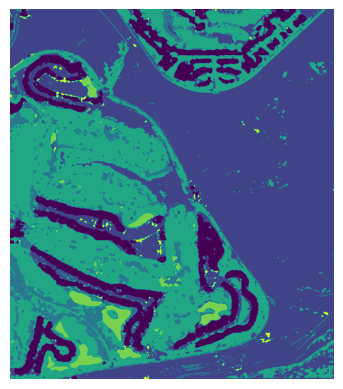

In [ ]:
patched_prediction2 = []

for i in range(patches_img2.shape[0]):
    for j in range(patches_img2.shape[1]):
        single_patch_img2 = patches_img2[i,j,:,:,:]
        single_patch_img2 = scaler.fit_transform(single_patch_img2.reshape(-1, single_patch_img2.shape[-1])).reshape(single_patch_img2.shape)
        single_patch_img2 = np.expand_dims(single_patch_img2, axis=0)
        pred = model2.predict(single_patch_img2)
        pred = np.argmax(pred, axis=3)
        pred = pred[0, :,:]
        patched_prediction2.append(pred)

patched_prediction2 = np.array(patched_prediction2)
patched_prediction2 = np.reshape(patched_prediction2, [patches_img2.shape[0], patches_img2.shape[1], 
                                            patches_img2.shape[2], patches_img2.shape[3]])

unpatched_prediction2 = unpatchify(patched_prediction2, (large_img2.shape[0], large_img2.shape[1]))

plt.axis('off')
plt.imshow(unpatched_prediction2)

In [ ]:
input_img2 = scaler.fit_transform(img2.reshape(-1, img2.shape[-1])).reshape(img2.shape)
predictions_smooth2 = predict_img_with_smooth_windowing(
    input_img2,
    window_size=patch_size,
    subdivisions=2,
    nb_classes=n_classes,
    pred_func=(
        lambda img_batch_subdiv: model2.predict(img_batch_subdiv)
    )
)
final_prediction2 = np.argmax(predictions_smooth2, axis=2)

  0%|          | 0/8 [00:00<?, ?it/s]

8/8 [==============================] - 4s 503ms/step


 12%|█▎        | 1/8 [00:07<00:50,  7.29s/it]

8/8 [==============================] - 1s 139ms/step


 25%|██▌       | 2/8 [00:14<00:41,  6.96s/it]

8/8 [==============================] - 1s 140ms/step


 38%|███▊      | 3/8 [00:19<00:32,  6.42s/it]

8/8 [==============================] - 1s 138ms/step


 50%|█████     | 4/8 [00:26<00:25,  6.41s/it]

8/8 [==============================] - 1s 134ms/step


 62%|██████▎   | 5/8 [00:31<00:18,  6.12s/it]

8/8 [==============================] - 1s 140ms/step


 75%|███████▌  | 6/8 [00:36<00:11,  5.74s/it]

8/8 [==============================] - 1s 139ms/step


 88%|████████▊ | 7/8 [00:43<00:06,  6.22s/it]

8/8 [==============================] - 1s 140ms/step


100%|██████████| 8/8 [00:50<00:00,  6.29s/it]


In [ ]:
SIZE_X = (img3.shape[1]//patch_size)*patch_size
SIZE_Y = (img3.shape[0]//patch_size)*patch_size
large_img3 = Image.fromarray(img3)
large_img3 = large_img3.crop((0 ,0, SIZE_X, SIZE_Y))
large_img3 = np.array(large_img3)     


patches_img3 = patchify(large_img3, (patch_size, patch_size, 3), step=patch_size)
patches_img3 = patches_img3[:,:,0,:,:,:]

1/1 [==============================] - 0s 38ms/step


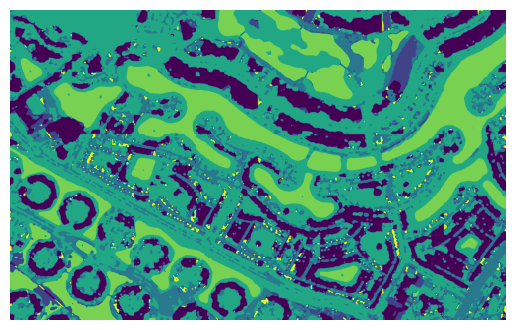

In [ ]:
patched_prediction3 = []

for i in range(patches_img3.shape[0]):
    for j in range(patches_img3.shape[1]):
        single_patch_img3 = patches_img3[i,j,:,:,:]
        single_patch_img3 = scaler.fit_transform(single_patch_img3.reshape(-1, single_patch_img3.shape[-1])).reshape(single_patch_img3.shape)
        single_patch_img3 = np.expand_dims(single_patch_img3, axis=0)
        pred = model2.predict(single_patch_img3)
        pred = np.argmax(pred, axis=3)
        pred = pred[0, :,:]
        patched_prediction3.append(pred)

patched_prediction3 = np.array(patched_prediction3)
patched_prediction3 = np.reshape(patched_prediction3, [patches_img3.shape[0], patches_img3.shape[1], 
                                            patches_img3.shape[2], patches_img3.shape[3]])

unpatched_prediction3 = unpatchify(patched_prediction3, (large_img3.shape[0], large_img3.shape[1]))

plt.axis('off')
plt.imshow(unpatched_prediction3)

In [ ]:
input_img3 = scaler.fit_transform(img3.reshape(-1, img3.shape[-1])).reshape(img3.shape)
predictions_smooth3 = predict_img_with_smooth_windowing(
    input_img3,
    window_size=patch_size,
    subdivisions=2,
    nb_classes=n_classes,
    pred_func=(
        lambda img_batch_subdiv: model2.predict(img_batch_subdiv)
    )
)
final_prediction3 = np.argmax(predictions_smooth3, axis=2)

  0%|          | 0/8 [00:00<?, ?it/s]

7/7 [==============================] - 1s 140ms/step


 12%|█▎        | 1/8 [00:04<00:34,  5.00s/it]

7/7 [==============================] - 1s 141ms/step


 25%|██▌       | 2/8 [00:09<00:27,  4.56s/it]

7/7 [==============================] - 1s 143ms/step


 38%|███▊      | 3/8 [00:15<00:26,  5.25s/it]

7/7 [==============================] - 1s 139ms/step


 50%|█████     | 4/8 [00:19<00:20,  5.02s/it]

7/7 [==============================] - 1s 143ms/step


 62%|██████▎   | 5/8 [00:24<00:13,  4.66s/it]

7/7 [==============================] - 1s 144ms/step


 75%|███████▌  | 6/8 [00:28<00:09,  4.66s/it]

7/7 [==============================] - 1s 141ms/step


 88%|████████▊ | 7/8 [00:34<00:04,  4.98s/it]

7/7 [==============================] - 1s 145ms/step


100%|██████████| 8/8 [00:38<00:00,  4.81s/it]


In [ ]:
prediction_with_smooth_blending = label_to_rgb(final_prediction)
prediction_without_smooth_blending = label_to_rgb(unpatched_prediction)
prediction_with_smooth_blending2 = label_to_rgb(final_prediction2)
prediction_without_smooth_blending2 = label_to_rgb(unpatched_prediction2)
prediction_with_smooth_blending3 = label_to_rgb(final_prediction3)
prediction_without_smooth_blending3 = label_to_rgb(unpatched_prediction3)

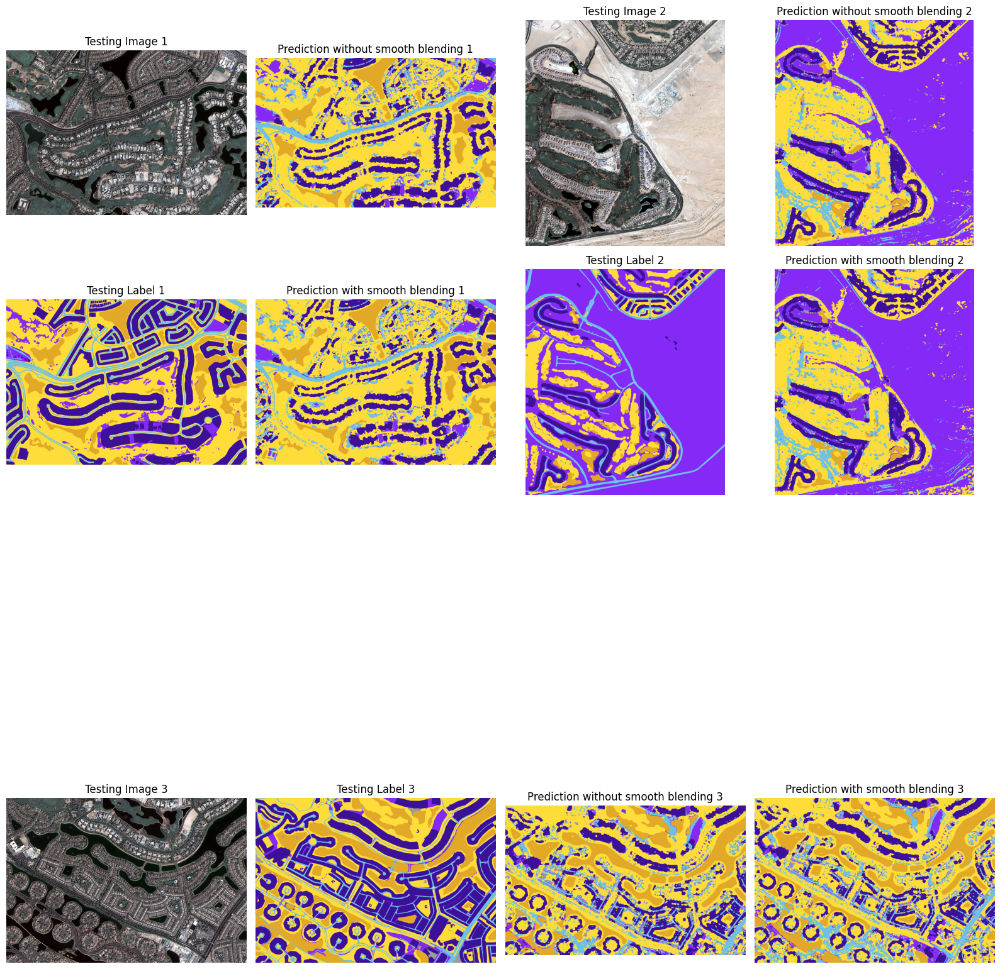

In [ ]:
plt.figure(figsize=(16, 16))

# Вывод первого изображения
plt.subplot(441)
plt.title('Testing Image 1')
plt.imshow(img)
plt.axis('off')

plt.subplot(445)
plt.title('Testing Label 1')
plt.imshow(original_mask)
plt.axis('off')

plt.subplot(442)
plt.title('Prediction without smooth blending 1')
plt.imshow(prediction_without_smooth_blending)
plt.axis('off')

plt.subplot(446)
plt.title('Prediction with smooth blending 1')
plt.imshow(prediction_with_smooth_blending)
plt.axis('off')

# Вывод второго изображения
plt.subplot(443)
plt.title('Testing Image 2')
plt.imshow(img2)
plt.axis('off')

plt.subplot(447)
plt.title('Testing Label 2')
plt.imshow(original_mask2)
plt.axis('off')

plt.subplot(444)
plt.title('Prediction without smooth blending 2')
plt.imshow(prediction_without_smooth_blending2)  # Замените на правильное имя переменной
plt.axis('off')

plt.subplot(448)
plt.title('Prediction with smooth blending 2')
plt.imshow(prediction_with_smooth_blending2)  # Замените на правильное имя переменной
plt.axis('off')

# Вывод третьего изображения
plt.subplot(4, 4, 13)
plt.title('Testing Image 3')
plt.imshow(img3)
plt.axis('off')

plt.subplot(4, 4, 14)
plt.title('Testing Label 3')
plt.imshow(original_mask3)
plt.axis('off')

plt.subplot(4, 4, 15)
plt.title('Prediction without smooth blending 3')
plt.imshow(prediction_without_smooth_blending3)  # Замените на правильное имя переменной
plt.axis('off')

plt.subplot(4, 4, 16)
plt.title('Prediction with smooth blending 3')
plt.imshow(prediction_with_smooth_blending3)  # Замените на правильное имя переменной
plt.axis('off')

plt.tight_layout()
plt.show()


### 2.3. Загрузите наиболее удачную модель из предыдущей работы. Сравните её точность с моделью, обученной в этой работе

In [ ]:
model = load_model("/content/drive/MyDrive/ModelZad7(Focal).h5", compile=False)
model2 = load_model("/content/drive/MyDrive/ModelZad7(2).h5", compile=False)

### 2.4. Отобразите предсказанную маску для каждого из трех снимков, загруженных ранее, в следующем формате: (исходный снимок, эталонная маска, предсказанная маска по модели, обученной в этой работе, предсказанная маска по модели, обученной в 6 работе. 

In [ ]:
import cv2
img = cv2.imread("/content/drive/MyDrive/Semantic segmentation dataset/Tile 2/images/image_part_005.jpg", 1)
original_mask = cv2.imread("/content/drive/MyDrive/Semantic segmentation dataset/Tile 2/masks/image_part_005.png", 1)
original_mask = cv2.cvtColor(original_mask,cv2.COLOR_BGR2RGB)

In [ ]:
patch_size = 256

input_img = scaler.fit_transform(img.reshape(-1, img.shape[-1])).reshape(img.shape)
# При использовании алгоритма Вы передаёте Вашу `pred_func` (model.predict(...)), которая будет обрабатывать все изображения 8 раз, накладывая небольшие участки с перекрытием, 
# Обратите внимание, что model.predict(...) принимает 4D тензор формы (batch, x, y, nb_channels).
predictions_smooth2 = predict_img_with_smooth_windowing(
    input_img,
    window_size=patch_size,
    subdivisions=2,  # Минимальное количество перекрытий для окон. Должно быть четным числом.
    nb_classes=n_classes,
    pred_func=(
        lambda img_batch_subdiv: model.predict((img_batch_subdiv))
    )
)

final_prediction_model = np.argmax(predictions_smooth2, axis=2)

predictions_smooth2 = predict_img_with_smooth_windowing(
    input_img,
    window_size=patch_size,
    subdivisions=2,  # Минимальное количество перекрытий для окон. Должно быть четным числом.
    nb_classes=n_classes,
    pred_func=(
        lambda img_batch_subdiv: model2.predict((img_batch_subdiv))
    )
)

final_prediction_model2 = np.argmax(predictions_smooth2, axis=2)

  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 4s 4s/step


 12%|█▎        | 1/8 [00:07<00:55,  7.92s/it]

1/1 [==============================] - 0s 64ms/step


 25%|██▌       | 2/8 [00:09<00:26,  4.43s/it]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 3/8 [00:11<00:15,  3.12s/it]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 4/8 [00:13<00:10,  2.52s/it]

1/1 [==============================] - 0s 34ms/step


 62%|██████▎   | 5/8 [00:14<00:06,  2.12s/it]

1/1 [==============================] - 0s 36ms/step


 75%|███████▌  | 6/8 [00:16<00:03,  1.94s/it]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 7/8 [00:17<00:01,  1.78s/it]

1/1 [==============================] - 0s 36ms/step


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 2s 2s/step


 12%|█▎        | 1/8 [00:04<00:30,  4.39s/it]

1/1 [==============================] - 0s 46ms/step


 25%|██▌       | 2/8 [00:06<00:17,  2.88s/it]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 3/8 [00:07<00:11,  2.21s/it]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 4/8 [00:09<00:07,  1.91s/it]

1/1 [==============================] - 0s 30ms/step


 62%|██████▎   | 5/8 [00:10<00:05,  1.71s/it]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 6/8 [00:11<00:03,  1.60s/it]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 7/8 [00:13<00:01,  1.54s/it]

1/1 [==============================] - 0s 28ms/step


100%|██████████| 8/8 [00:14<00:00,  1.83s/it]


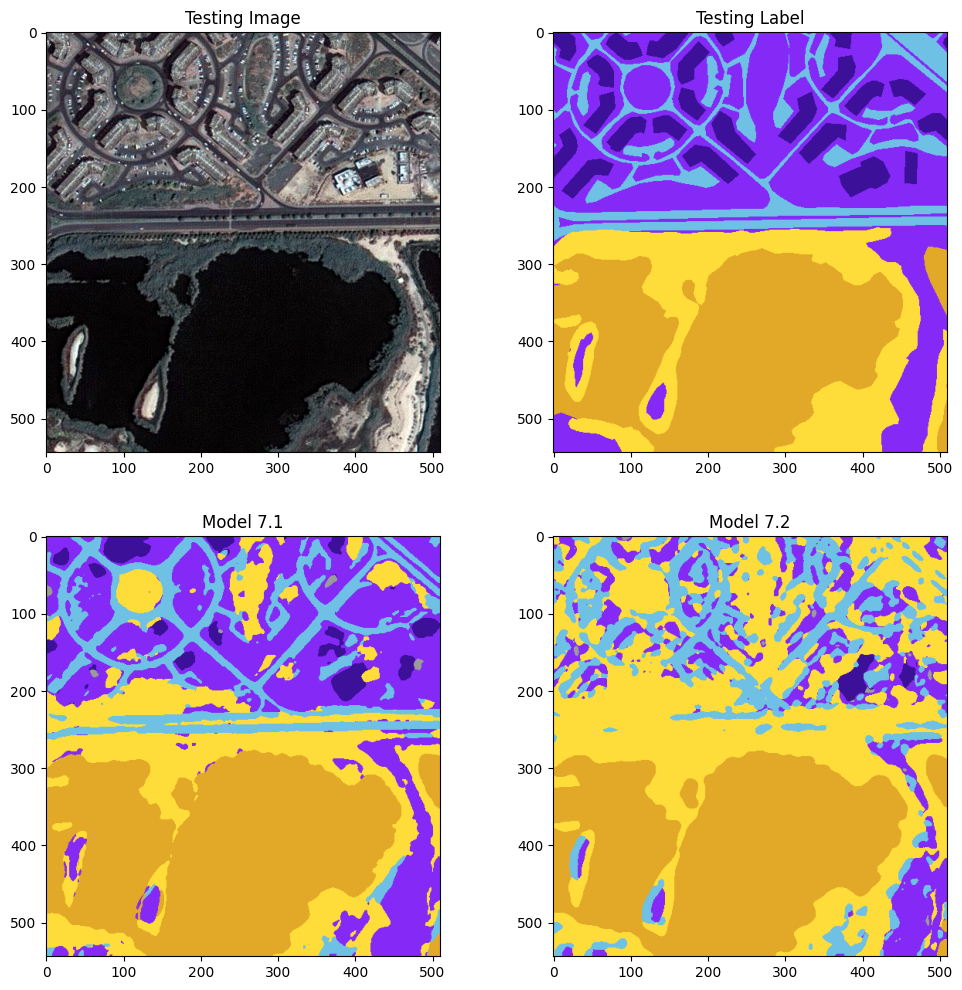

In [ ]:
prediction_without_smooth_blending__model=label_to_rgb(final_prediction_model)
prediction_without_smooth_blending__model2=label_to_rgb(final_prediction_model2)


plt.figure(figsize=(12, 12))
plt.subplot(221)
plt.title('Testing Image')
plt.imshow(img)
plt.subplot(222)
plt.title('Testing Label')
plt.imshow(original_mask)
plt.subplot(223)
plt.title('Model 7.1')
plt.imshow(prediction_without_smooth_blending__model)
plt.subplot(224)
plt.title('Model 7.2')
plt.imshow(prediction_without_smooth_blending__model2)
plt.show()

In [ ]:
import cv2
img = cv2.imread("/content/drive/MyDrive/Semantic segmentation dataset/Tile 4/images/image_part_008.jpg", 1)
original_mask = cv2.imread("/content/drive/MyDrive/Semantic segmentation dataset/Tile 4/masks/image_part_008.png", 1)
original_mask = cv2.cvtColor(original_mask,cv2.COLOR_BGR2RGB)

In [ ]:
patch_size = 256

input_img = scaler.fit_transform(img.reshape(-1, img.shape[-1])).reshape(img.shape)
# При использовании алгоритма Вы передаёте Вашу `pred_func` (model.predict(...)), которая будет обрабатывать все изображения 8 раз, накладывая небольшие участки с перекрытием, 
# Обратите внимание, что model.predict(...) принимает 4D тензор формы (batch, x, y, nb_channels).
predictions_smooth2 = predict_img_with_smooth_windowing(
    input_img,
    window_size=patch_size,
    subdivisions=2,  # Минимальное количество перекрытий для окон. Должно быть четным числом.
    nb_classes=n_classes,
    pred_func=(
        lambda img_batch_subdiv: model.predict((img_batch_subdiv))
    )
)

final_prediction_model = np.argmax(predictions_smooth2, axis=2)

predictions_smooth2 = predict_img_with_smooth_windowing(
    input_img,
    window_size=patch_size,
    subdivisions=2,  # Минимальное количество перекрытий для окон. Должно быть четным числом.
    nb_classes=n_classes,
    pred_func=(
        lambda img_batch_subdiv: model2.predict((img_batch_subdiv))
    )
)

final_prediction_model2 = np.argmax(predictions_smooth2, axis=2)

  0%|          | 0/8 [00:00<?, ?it/s]

2/2 [==============================] - 0s 256ms/step


 12%|█▎        | 1/8 [00:02<00:17,  2.49s/it]

2/2 [==============================] - 0s 246ms/step


 25%|██▌       | 2/8 [00:05<00:15,  2.63s/it]

2/2 [==============================] - 0s 226ms/step


 38%|███▊      | 3/8 [00:07<00:12,  2.46s/it]

2/2 [==============================] - 0s 188ms/step


 50%|█████     | 4/8 [00:09<00:09,  2.32s/it]

2/2 [==============================] - 0s 187ms/step


 62%|██████▎   | 5/8 [00:11<00:06,  2.23s/it]

2/2 [==============================] - 0s 187ms/step


 75%|███████▌  | 6/8 [00:13<00:04,  2.18s/it]

2/2 [==============================] - 0s 200ms/step


 88%|████████▊ | 7/8 [00:15<00:02,  2.15s/it]

2/2 [==============================] - 0s 240ms/step


  0%|          | 0/8 [00:00<?, ?it/s]

2/2 [==============================] - 0s 180ms/step


 12%|█▎        | 1/8 [00:02<00:16,  2.38s/it]

2/2 [==============================] - 0s 177ms/step


 25%|██▌       | 2/8 [00:04<00:13,  2.18s/it]

2/2 [==============================] - 0s 136ms/step


 38%|███▊      | 3/8 [00:06<00:10,  2.07s/it]

2/2 [==============================] - 0s 134ms/step


 50%|█████     | 4/8 [00:08<00:08,  2.14s/it]

2/2 [==============================] - 0s 145ms/step


 62%|██████▎   | 5/8 [00:10<00:06,  2.15s/it]

2/2 [==============================] - 0s 177ms/step


 75%|███████▌  | 6/8 [00:13<00:04,  2.27s/it]

2/2 [==============================] - 0s 168ms/step


 88%|████████▊ | 7/8 [00:15<00:02,  2.41s/it]

2/2 [==============================] - 0s 175ms/step


100%|██████████| 8/8 [00:18<00:00,  2.26s/it]


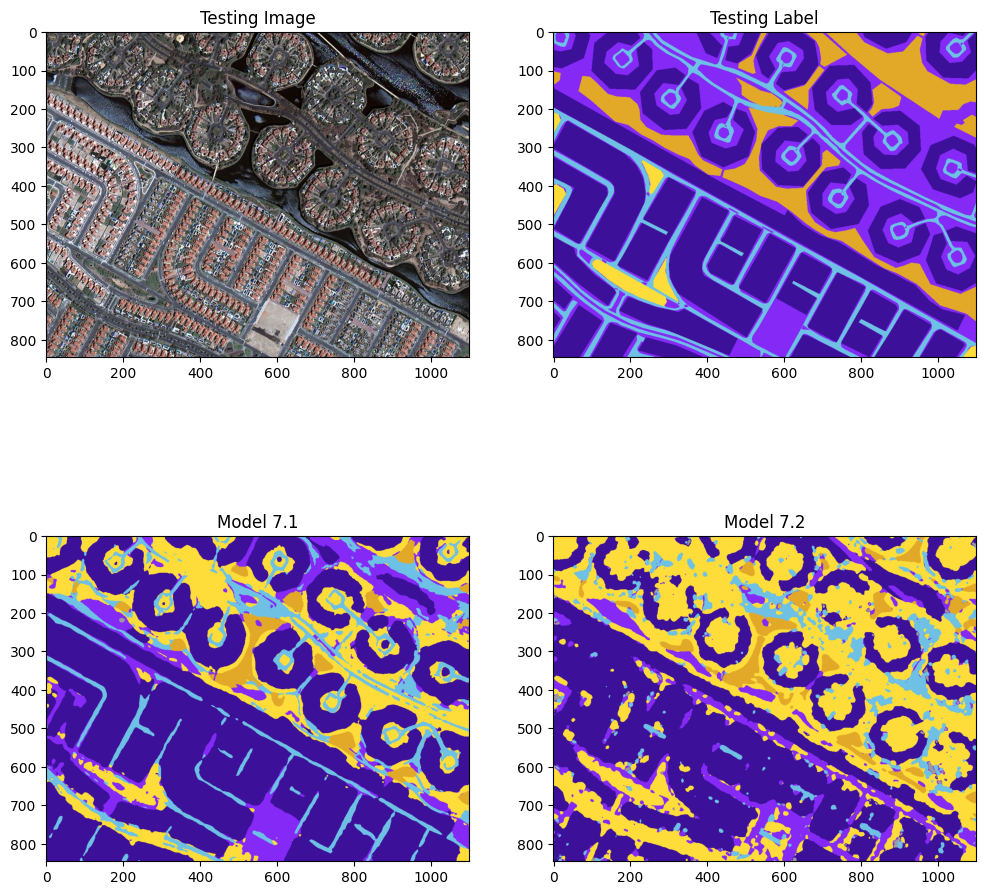

In [ ]:
prediction_without_smooth_blending__model=label_to_rgb(final_prediction_model)
prediction_without_smooth_blending__model2=label_to_rgb(final_prediction_model2)


plt.figure(figsize=(12, 12))
plt.subplot(221)
plt.title('Testing Image')
plt.imshow(img)
plt.subplot(222)
plt.title('Testing Label')
plt.imshow(original_mask)
plt.subplot(223)
plt.title('Model 7.1')
plt.imshow(prediction_without_smooth_blending__model)
plt.subplot(224)
plt.title('Model 7.2')
plt.imshow(prediction_without_smooth_blending__model2)
plt.show()

In [ ]:
import cv2
img = cv2.imread("/content/drive/MyDrive/Semantic segmentation dataset/Tile 5/images/image_part_001.jpg", 1)
original_mask = cv2.imread("/content/drive/MyDrive/Semantic segmentation dataset/Tile 5/masks/image_part_001.png", 1)
original_mask = cv2.cvtColor(original_mask,cv2.COLOR_BGR2RGB)

In [ ]:
patch_size = 256

input_img = scaler.fit_transform(img.reshape(-1, img.shape[-1])).reshape(img.shape)
# При использовании алгоритма Вы передаёте Вашу `pred_func` (model.predict(...)), которая будет обрабатывать все изображения 8 раз, накладывая небольшие участки с перекрытием, 
# Обратите внимание, что model.predict(...) принимает 4D тензор формы (batch, x, y, nb_channels).
predictions_smooth2 = predict_img_with_smooth_windowing(
    input_img,
    window_size=patch_size,
    subdivisions=2,  # Минимальное количество перекрытий для окон. Должно быть четным числом.
    nb_classes=n_classes,
    pred_func=(
        lambda img_batch_subdiv: model.predict((img_batch_subdiv))
    )
)

final_prediction_model = np.argmax(predictions_smooth2, axis=2)

predictions_smooth2 = predict_img_with_smooth_windowing(
    input_img,
    window_size=patch_size,
    subdivisions=2,  # Минимальное количество перекрытий для окон. Должно быть четным числом.
    nb_classes=n_classes,
    pred_func=(
        lambda img_batch_subdiv: model2.predict((img_batch_subdiv))
    )
)

final_prediction_model2 = np.argmax(predictions_smooth2, axis=2)

  0%|          | 0/8 [00:00<?, ?it/s]

3/3 [==============================] - 0s 216ms/step


 12%|█▎        | 1/8 [00:02<00:17,  2.47s/it]

3/3 [==============================] - 0s 213ms/step


 25%|██▌       | 2/8 [00:05<00:17,  2.95s/it]

3/3 [==============================] - 0s 206ms/step


 38%|███▊      | 3/8 [00:09<00:15,  3.18s/it]

3/3 [==============================] - 0s 212ms/step


 50%|█████     | 4/8 [00:11<00:11,  2.90s/it]

3/3 [==============================] - 0s 189ms/step


 62%|██████▎   | 5/8 [00:13<00:08,  2.69s/it]

3/3 [==============================] - 0s 224ms/step


 75%|███████▌  | 6/8 [00:16<00:05,  2.62s/it]

3/3 [==============================] - 0s 191ms/step


 88%|████████▊ | 7/8 [00:18<00:02,  2.52s/it]

3/3 [==============================] - 1s 225ms/step


  0%|          | 0/8 [00:00<?, ?it/s]

3/3 [==============================] - 0s 161ms/step


 12%|█▎        | 1/8 [00:02<00:17,  2.53s/it]

3/3 [==============================] - 0s 156ms/step


 25%|██▌       | 2/8 [00:04<00:14,  2.39s/it]

3/3 [==============================] - 0s 134ms/step


 38%|███▊      | 3/8 [00:07<00:11,  2.33s/it]

3/3 [==============================] - 0s 157ms/step


 50%|█████     | 4/8 [00:09<00:09,  2.33s/it]

3/3 [==============================] - 0s 153ms/step


 62%|██████▎   | 5/8 [00:11<00:07,  2.38s/it]

3/3 [==============================] - 0s 158ms/step


 75%|███████▌  | 6/8 [00:14<00:05,  2.52s/it]

3/3 [==============================] - 0s 161ms/step


 88%|████████▊ | 7/8 [00:17<00:02,  2.51s/it]

3/3 [==============================] - 0s 159ms/step


100%|██████████| 8/8 [00:19<00:00,  2.42s/it]


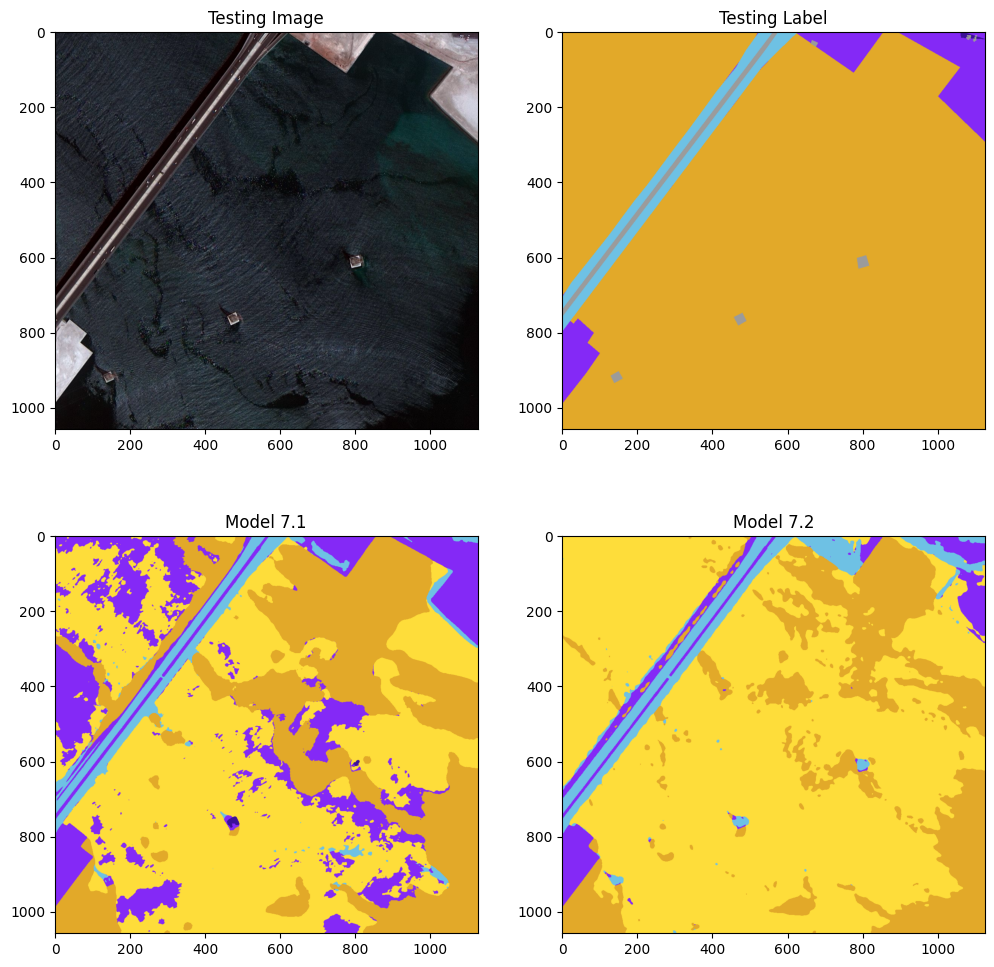

In [ ]:
prediction_without_smooth_blending__model=label_to_rgb(final_prediction_model)
prediction_without_smooth_blending__model2=label_to_rgb(final_prediction_model2)


plt.figure(figsize=(12, 12))
plt.subplot(221)
plt.title('Testing Image')
plt.imshow(img)
plt.subplot(222)
plt.title('Testing Label')
plt.imshow(original_mask)
plt.subplot(223)
plt.title('Model 7.1')
plt.imshow(prediction_without_smooth_blending__model)
plt.subplot(224)
plt.title('Model 7.2')
plt.imshow(prediction_without_smooth_blending__model2)
plt.show()

## Задание №3. Используйте модель с Unet-подобной архитектурой для решения задач №2 и №3 из практической работы №6

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from imutils import paths
import cv2
from google.colab.patches import cv2_imshow

from tensorflow.keras import layers
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Model
def noise(array):
    """
    Добавляет случайный шум к каждому изображению в предоставленном массиве.

    """

    noise_factor = 0.1
    noisy_array = array + noise_factor * np.random.normal(
        loc=0.0, scale=1.0, size=array.shape
    )

    return np.clip(noisy_array, 0.0, 1.0)

In [ ]:
def preprocess(array):
    """
    Нормализует предоставленный массив и преобразует его в соответствующий формат.
    """
    array = array.astype("float32") / 255.0
    array = np.reshape(array, (len(array), 104, 104, 3))
    return array

In [ ]:
images = []
imagePaths = sorted(list(paths.list_images("/content/drive/MyDrive/BSR_bsds500/BSR/BSDS500/data/images/")))
n = len(imagePaths)
for i in range(200):
	if i % 10==0:
		print(i)
	image = cv2.imread(imagePaths[i])
	try:
		image = cv2.resize(image, (104, 104))
		images.append(image) # добавляем в список
	except Exception as e:
		print(e)
		print('фото не обработалось',imagePaths[i])
print(i, 'фотографий')

0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
199 фотографий


In [ ]:
def display(array1, array2, n):
    """
    Отображает десять случайных изображений из каждого из предоставленных массивов.
    """

    indices = np.random.randint(len(array1), size=n)
    images1 = np.asarray(array1)[indices, :]
    images2 = np.asarray(array2)[indices, :]

    plt.figure(figsize=(20, 4))
    for i, (image1, image2) in enumerate(zip(images1, images2)):
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(cv2.cvtColor(image1, cv2.COLOR_RGB2BGR))

        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(cv2.cvtColor(image2, cv2.COLOR_RGB2BGR))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    plt.show()

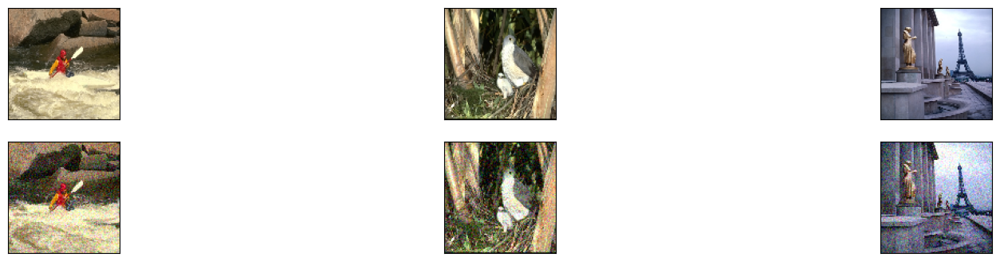

In [ ]:
n_images = preprocess(np.asarray(images))
n_noisy_images = noise(n_images)
display(n_images, np.float32(n_noisy_images),3)
# print(n_images.shape, n_noisy_images.shape)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(n_noisy_images, n_images, test_size=0.2, random_state=0)



In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import Model

def conv_block(input_tensor, num_filters):
    encoder = layers.Conv2D(num_filters, (3, 3), padding='same')(input_tensor)
    encoder = layers.BatchNormalization()(encoder)
    encoder = layers.Activation('relu')(encoder)
    encoder = layers.Conv2D(num_filters, (3, 3), padding='same')(encoder)
    encoder = layers.BatchNormalization()(encoder)
    encoder = layers.Activation('relu')(encoder)
    return encoder

def decoder_block(input_tensor, concat_tensor, num_filters):
    decoder = layers.Conv2DTranspose(num_filters, (2, 2), strides=(2, 2), padding='same')(input_tensor)
    decoder = layers.concatenate([concat_tensor, decoder], axis=-1)
    decoder = layers.BatchNormalization()(decoder)
    decoder = layers.Activation('relu')(decoder)
    decoder = layers.Conv2D(num_filters, (3, 3), padding='same')(decoder)
    decoder = layers.BatchNormalization()(decoder)
    decoder = layers.Activation('relu')(decoder)
    decoder = layers.Conv2D(num_filters, (3, 3), padding='same')(decoder)
    decoder = layers.BatchNormalization()(decoder)
    decoder = layers.Activation('relu')(decoder)
    return decoder

def unet_model(input_shape=(32, 32, 3), num_classes=1):
    inputs = layers.Input(shape=input_shape)
    
    enc1 = conv_block(inputs, 64)
    pool1 = layers.MaxPooling2D((2, 2))(enc1)
    
    enc2 = conv_block(pool1, 128)
    pool2 = layers.MaxPooling2D((2, 2))(enc2)
    
    enc3 = conv_block(pool2, 256)
    pool3 = layers.MaxPooling2D((2, 2))(enc3)
    
    enc4 = conv_block(pool3, 512)
    pool4 = layers.MaxPooling2D((2, 2))(enc4)
    
    center = conv_block(pool4, 1024)
    
    dec4 = decoder_block(center, enc4, 512)
    dec3 = decoder_block(dec4, enc3, 256)
    dec2 = decoder_block(dec3, enc2, 128)
    dec1 = decoder_block(dec2, enc1, 64)
    
    outputs = layers.Conv2D(3, (1, 1), activation='sigmoid')(dec1)
    
    model = Model(inputs=[inputs], outputs=[outputs])
    
    return model
autoencoder = Model(input, x)

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.001)
autoencoder.compile(optimizer=optimizer, loss="mean_squared_error", metrics=['mse', 'accuracy'])

In [ ]:
autoencoder.fit(
x=X_train,
y=y_train,
epochs=50,
batch_size=128,
shuffle=True,
validation_data=(X_test, y_test),
)

Epoch 1/50
2/2 [==============================] - 2s 524ms/step - loss: 0.0689 - mse: 0.0689 - accuracy: 0.3584 - val_loss: 0.0671 - val_mse: 0.0671 - val_accuracy: 0.4043
Epoch 2/50
2/2 [==============================] - 0s 58ms/step - loss: 0.0678 - mse: 0.0678 - accuracy: 0.3789 - val_loss: 0.0658 - val_mse: 0.0658 - val_accuracy: 0.4267
Epoch 3/50
2/2 [==============================] - 0s 59ms/step - loss: 0.0668 - mse: 0.0668 - accuracy: 0.3937 - val_loss: 0.0646 - val_mse: 0.0646 - val_accuracy: 0.4207
Epoch 4/50
2/2 [==============================] - 0s 57ms/step - loss: 0.0659 - mse: 0.0659 - accuracy: 0.3866 - val_loss: 0.0634 - val_mse: 0.0634 - val_accuracy: 0.4163
Epoch 5/50
2/2 [==============================] - 0s 56ms/step - loss: 0.0648 - mse: 0.0648 - accuracy: 0.3858 - val_loss: 0.0621 - val_mse: 0.0621 - val_accuracy: 0.4361
Epoch 6/50
2/2 [==============================] - 0s 55ms/step - loss: 0.0636 - mse: 0.0636 - accuracy: 0.3999 - val_loss: 0.0607 - val_mse: 0.0

In [ ]:
predictions = autoencoder.predict(X_train)

5/5 [==============================] - 0s 7ms/step


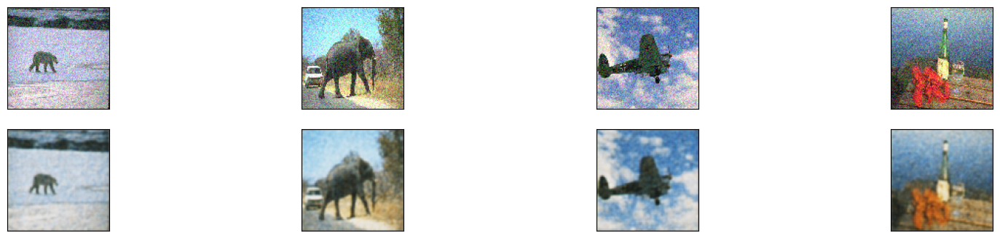

In [ ]:
display(np.float32(X_train), np.float32(predictions), 4)

#Этап 3, задание 3 из 6 работы

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from imutils import paths
import cv2
from google.colab.patches import cv2_imshow

from tensorflow.keras import layers
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Model

In [ ]:
def preprocess(array, n):
    """
    Нормализует предоставленный массив и преобразует его в соответствующий формат.
    """
    array = np.reshape(array, (len(array), n, n, 3))
    array = array.astype("float32") / 255.0
    return array

In [ ]:
def display(array1, array2, n):
    """
    Отображает десять случайных изображений из каждого из предоставленных массивов.
    """
    indices = np.random.randint(len(array1), size=n)
    images1 = np.asarray(array1)[indices, :]
    images2 = np.asarray(array2)[indices, :]

    plt.figure(figsize=(20, 4))
    for i, (image1, image2) in enumerate(zip(images1, images2)):
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(cv2.cvtColor(image1, cv2.COLOR_RGB2BGR))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(cv2.cvtColor(image2, cv2.COLOR_RGB2BGR))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    plt.show()

0
10
20
30
40
50
60
70
80
90
99 фотографий


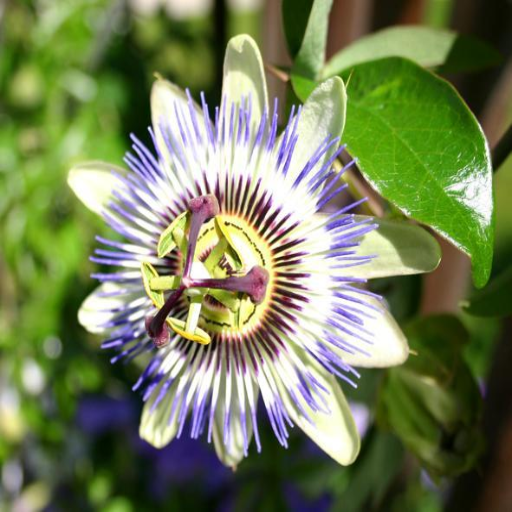

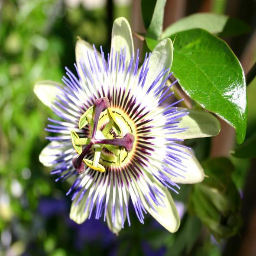

In [ ]:
images512 = []
images256 = []
i = 0
imagePaths = sorted(list(paths.list_images("/content/drive/MyDrive/100flowers")))
n = len(imagePaths)
for i in range(100):
	if i % 10 == 0:
		print(i)	
	image = cv2.imread(imagePaths[i])
	try:
		images512.append(cv2.resize(image, (512, 512)))
		images256.append(cv2.resize(image, (256, 256)))
	except Exception as e:
		print(e)
		print('фото не обработалось',imagePaths[i])
print(i, 'фотографий')
cv2_imshow(images512[0])
cv2_imshow(images256[0])

In [ ]:
input_shape = (256, 256, 3)
#Encoder
input_layer = layers.Input(shape=input_shape)
x = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(input_layer)
x = layers.MaxPooling2D((2, 2), padding="same")(x)

#Decoder
x = layers.Conv2DTranspose(64, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(64, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2D(3, (3, 3), activation="sigmoid", padding="same")(x)

optimizer = tf.keras.optimizers.Adam(0.001)


In [ ]:
#Autoencoder
from sklearn.model_selection import train_test_split

autoencoder = Model(input_layer, x)
autoencoder.compile(optimizer=optimizer, loss="mean_squared_error", metrics=['mse', 'accuracy'])
autoencoder.summary()

images256 = preprocess(np.asarray(images256), 256)
images512 = preprocess(np.asarray(images512), 512)

X_train, X_test, y_train, y_test = train_test_split(images256, images512, test_size=0.2, random_state=0)
print(X_train.shape, X_test.shape, y_train.shape,

y_test.shape)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 64)     0         
 )                                                               
                                                                 
 conv2d_transpose (Conv2DTra  (None, 256, 256, 64)     36928     
 nspose)                                                         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 512, 512, 64)     36928     
 ranspose)                                                       
                                                             

In [ ]:
autoencoder.fit(
x=X_train,
y=y_train,
epochs=50,
batch_size=10,
shuffle=True,
validation_data=(X_test, y_test),
)


Epoch 1/50
8/8 [==============================] - 133s 17s/step - loss: 0.0839 - mse: 0.0839 - accuracy: 0.2824 - val_loss: 0.0802 - val_mse: 0.0802 - val_accuracy: 0.4169
Epoch 2/50
8/8 [==============================] - 134s 17s/step - loss: 0.0745 - mse: 0.0745 - accuracy: 0.4782 - val_loss: 0.0632 - val_mse: 0.0632 - val_accuracy: 0.5233
Epoch 3/50
8/8 [==============================] - 133s 17s/step - loss: 0.0480 - mse: 0.0480 - accuracy: 0.5093 - val_loss: 0.0315 - val_mse: 0.0315 - val_accuracy: 0.5321
Epoch 4/50
8/8 [==============================] - 135s 17s/step - loss: 0.0248 - mse: 0.0248 - accuracy: 0.6122 - val_loss: 0.0170 - val_mse: 0.0170 - val_accuracy: 0.6529
Epoch 5/50
8/8 [==============================] - 131s 17s/step - loss: 0.0148 - mse: 0.0148 - accuracy: 0.6092 - val_loss: 0.0131 - val_mse: 0.0131 - val_accuracy: 0.5849
Epoch 6/50
8/8 [==============================] - 130s 17s/step - loss: 0.0115 - mse: 0.0115 - accuracy: 0.5948 - val_loss: 0.0103 - val_mse

3/3 [==============================] - 6s 1s/step


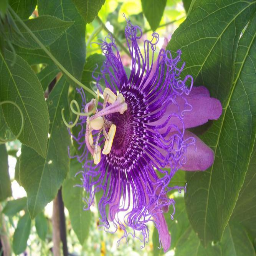

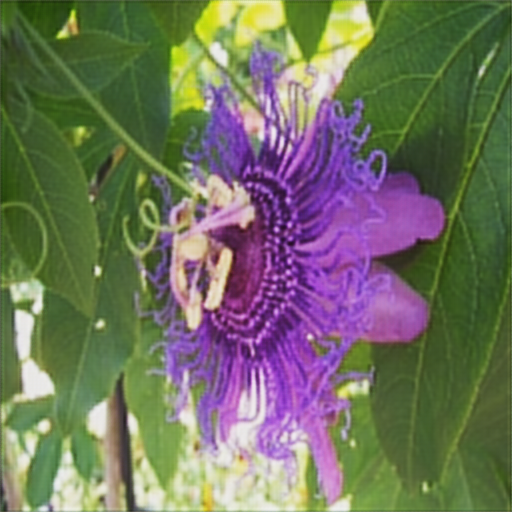

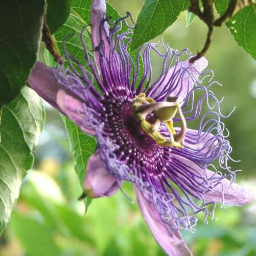

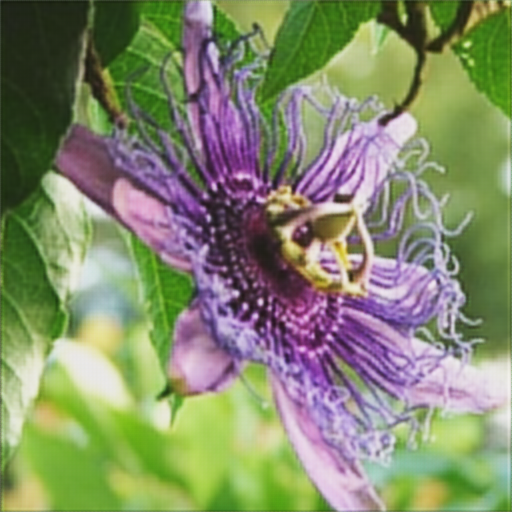

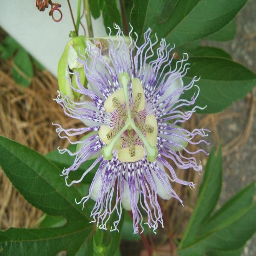

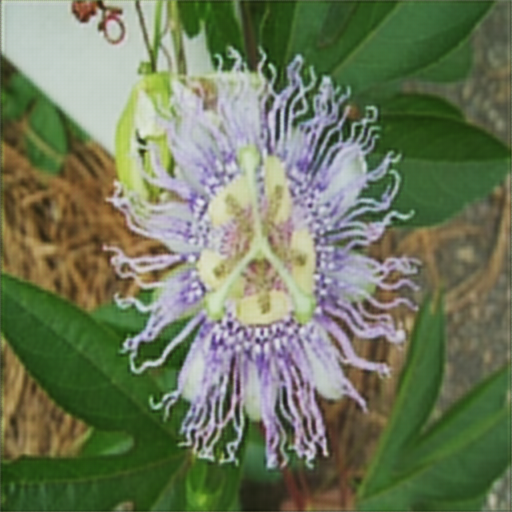

In [ ]:
predictions = autoencoder.predict(X_train)

for i in range(3):
  cv2_imshow(X_train[i]*255.0)
  cv2_imshow(predictions[i]*255.0)
  cv2.imwrite(f"original_image_{i}.jpg", X_train[i]*255.0)
  cv2.imwrite(f"autoencoder_image_{i}.jpg", predictions[i]*255.0)

### 3.1. Сравните полученные результаты

In [ ]:
from keras.models import load_model
from PIL import Image


ModelZad6 = load_model("/content/drive/MyDrive/ModelZad6.h5", compile=False)

0
10
20
30
40
50
60
70
80
90


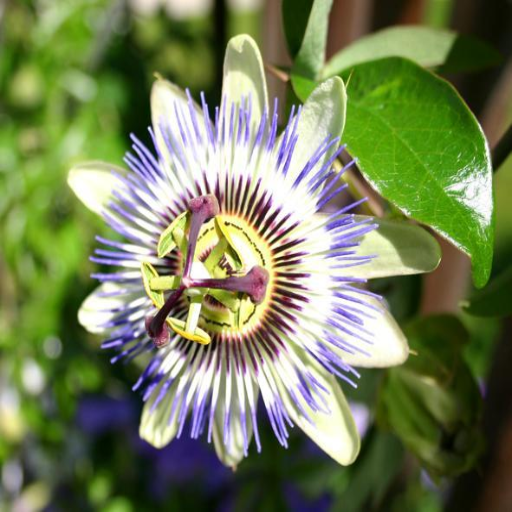

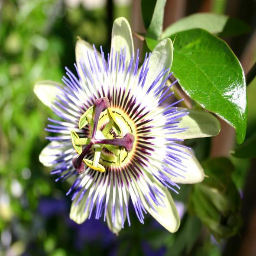

In [ ]:
images512 = []
images256 = []
i = 0
imagePaths = sorted(list(paths.list_images("/content/drive/MyDrive/100flowers")))
n = len(imagePaths)
for i in range(100):
    if i % 10 == 0:
        print(i)    
    image = cv2.imread(imagePaths[i])
    try:
        images512.append(cv2.resize(image, (512, 512)))
        images256.append(cv2.resize(image, (256, 256)))
    except Exception as e:
        print(e)
        print('фото не обработалось', imagePaths[i])
        print(i, 'фотографий')
cv2_imshow(images512[0])
cv2_imshow(images256[0])



In [ ]:
input_shape = (256, 256, 3)

input_layer = layers.Input(shape=input_shape)
x = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(input_layer)
x = layers.MaxPooling2D((2, 2), padding="same")(x)

x = layers.Conv2DTranspose(64, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(64, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2D(3, (3, 3), activation="sigmoid", padding="same")(x)

optimizer = tf.keras.optimizers.Adam(0.001)

In [ ]:
ModelZad6 = load_model("/content/drive/MyDrive/ModelZad6.h5", compile=False)
ModelZad6.summary()

images256 = preprocess(np.asarray(images256), 256)
images512 = preprocess(np.asarray(images512), 512)

X_train, X_test, y_train, y_test = train_test_split(images256, images512, test_size=0.2, random_state=0)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 64)     0         
 )                                                               
                                                                 
 conv2d_transpose (Conv2DTra  (None, 256, 256, 64)     36928     
 nspose)                                                         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 512, 512, 64)     36928     
 ranspose)                                                       
                                                             

In [ ]:
ModelZad6.compile(optimizer=optimizer, loss="mean_squared_error", metrics=['mse', 'accuracy'])
ModelZad6.fit(
x=X_train,
y=y_train,
epochs=50,
batch_size=10,
shuffle=True,
validation_data=(X_test, y_test),
)

Epoch 1/50
8/8 [==============================] - 4s 294ms/step - loss: 0.0840 - mse: 0.0840 - accuracy: 0.5720 - val_loss: 0.0804 - val_mse: 0.0804 - val_accuracy: 0.5959
Epoch 2/50
8/8 [==============================] - 2s 264ms/step - loss: 0.0750 - mse: 0.0750 - accuracy: 0.5994 - val_loss: 0.0626 - val_mse: 0.0626 - val_accuracy: 0.5969
Epoch 3/50
8/8 [==============================] - 2s 266ms/step - loss: 0.0479 - mse: 0.0479 - accuracy: 0.6007 - val_loss: 0.0298 - val_mse: 0.0298 - val_accuracy: 0.6184
Epoch 4/50
8/8 [==============================] - 2s 290ms/step - loss: 0.0249 - mse: 0.0249 - accuracy: 0.6226 - val_loss: 0.0167 - val_mse: 0.0167 - val_accuracy: 0.6280
Epoch 5/50
8/8 [==============================] - 2s 286ms/step - loss: 0.0144 - mse: 0.0144 - accuracy: 0.6136 - val_loss: 0.0129 - val_mse: 0.0129 - val_accuracy: 0.6212
Epoch 6/50
8/8 [==============================] - 2s 272ms/step - loss: 0.0116 - mse: 0.0116 - accuracy: 0.6216 - val_loss: 0.0104 - val_mse

3/3 [==============================] - 1s 350ms/step


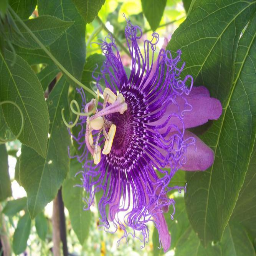

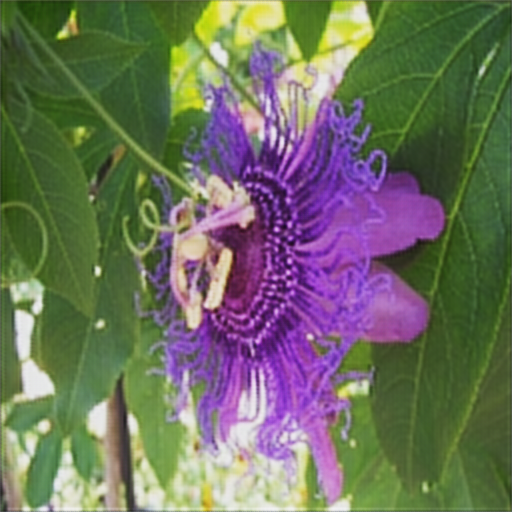

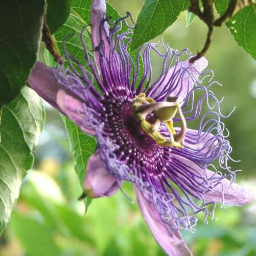

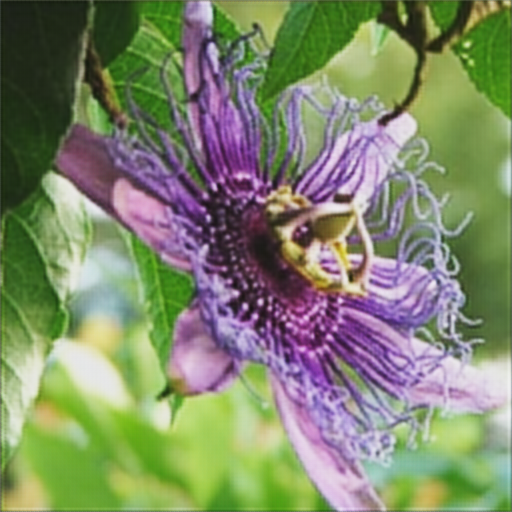

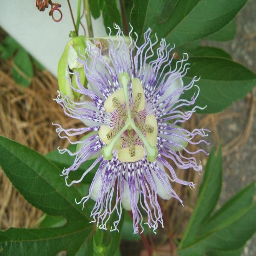

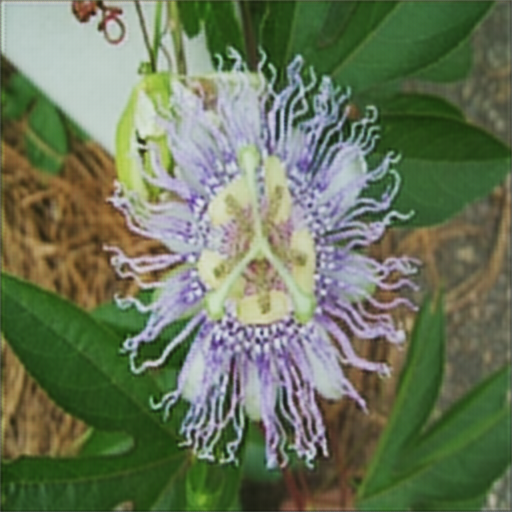

In [ ]:
predictions = ModelZad6.predict(X_train)
flowers_folder3 = '/content/drive/MyDrive/3flowers(NEW)'

for i in range(3):
  cv2_imshow(X_train[i] * 255.0)
  cv2_imshow(predictions[i] * 255.0)
  cv2.imwrite(f"ModelZad6_image_{i}.jpg", predictions[i]*255.0)

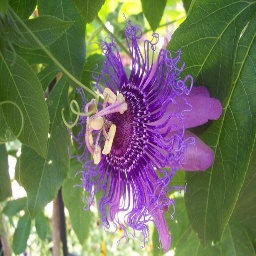

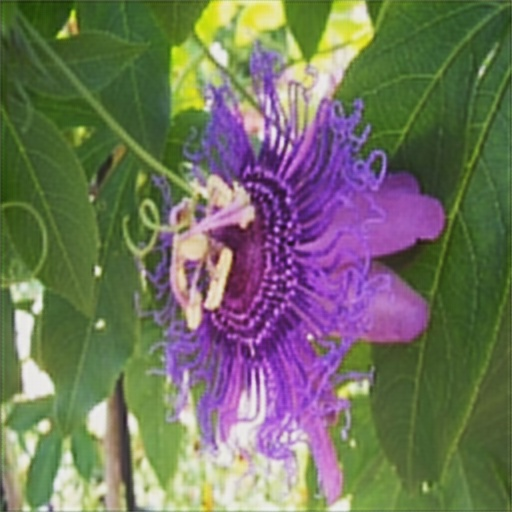

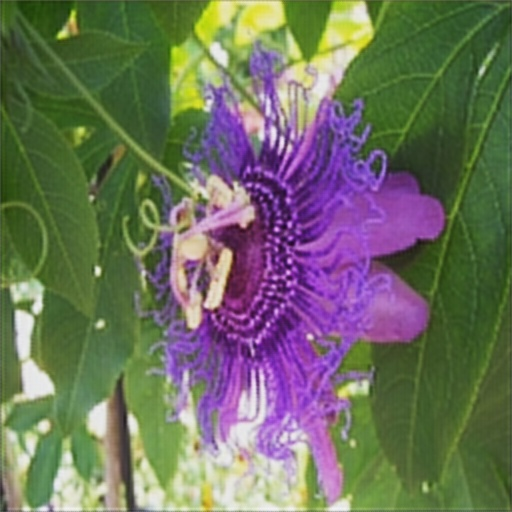

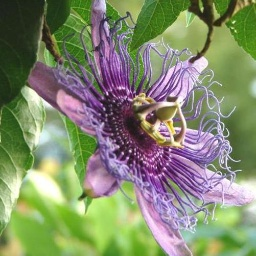

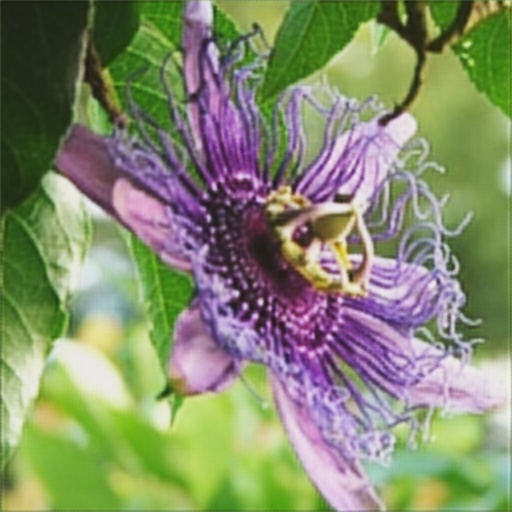

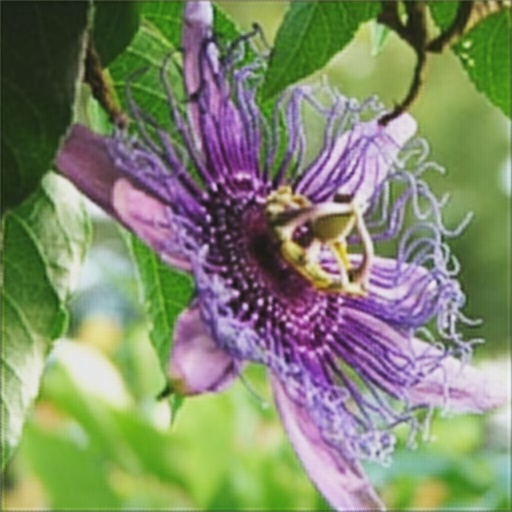

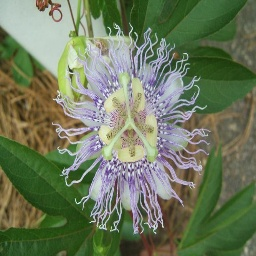

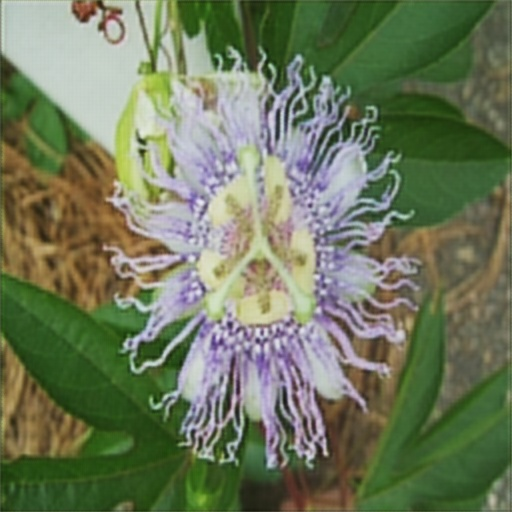

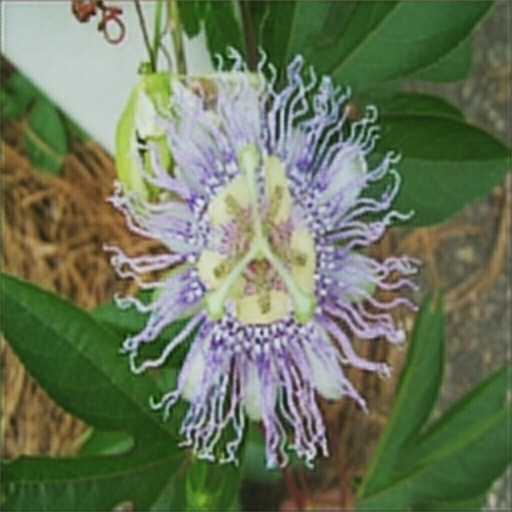

In [ ]:
from google.colab.patches import cv2_imshow
import numpy as np
import cv2

imo_6 = cv2.imread("/content/original_image_0.jpg")
cv2_imshow(imo_6)

im_6 = cv2.imread("/content/autoencoder_image_0.jpg")
cv2_imshow(im_6)

img_6 = cv2.imread("/content/ModelZad6_image_0.jpg")
cv2_imshow(img_6)



imo_7 = cv2.imread("/content/original_image_1.jpg")
cv2_imshow(imo_7)

im_7 = cv2.imread("/content/autoencoder_image_1.jpg")
cv2_imshow(im_7)

img_7 = cv2.imread("/content/ModelZad6_image_1.jpg")
cv2_imshow(img_7)



imo_8 = cv2.imread("/content/original_image_2.jpg")
cv2_imshow(imo_8)

im_8 = cv2.imread("/content/autoencoder_image_2.jpg")
cv2_imshow(im_8)

img_8 = cv2.imread("/content/ModelZad6_image_2.jpg")
cv2_imshow(img_8)